### Plotting the first design point

* $v_0(p_T)$ and $v_0(p_T)/v_0$ for centralities 50-60% and 60-70%
* PbPb 2.76 TeV Grad viscous correction

Loading data from design_points_data/differential_radial_flow/v0pt_design_points_results_Pb_Pb_2760_Grad.pkl...
Loaded 500 design points
DATA SUMMARY
Input file: design_points_data/differential_radial_flow/v0pt_design_points_results_Pb_Pb_2760_Grad.pkl
Total design points: 500
Design point shown: 0
Delta-f model index: 0
pT range (integrated): [0.5, 2.0]

--- Centrality: 50-60% ---
Number of events: 231

Global v0: 0.012485 ± 0.000591
Ensemble mean pT: 0.8787 GeV/c

pT bins (differential):
  Bin  0: [ 0.50,  0.60] GeV/c
  Bin  1: [ 0.60,  0.70] GeV/c
  Bin  2: [ 0.70,  0.80] GeV/c
  Bin  3: [ 0.80,  0.90] GeV/c
  Bin  4: [ 0.90,  1.02] GeV/c
  Bin  5: [ 1.02,  1.19] GeV/c
  Bin  6: [ 1.19,  1.39] GeV/c
  Bin  7: [ 1.39,  1.59] GeV/c
  Bin  8: [ 1.59,  1.79] GeV/c
  Bin  9: [ 1.79,  1.99] GeV/c
  Bin 10: [ 1.99,  2.19] GeV/c
  Bin 11: [ 2.19,  2.39] GeV/c
  Bin 12: [ 2.39,  2.59] GeV/c
  Bin 13: [ 2.59,  2.79] GeV/c
  Bin 14: [ 2.79,  2.99] GeV/c
  Bin 15: [ 2.99,  3.19] GeV/c
  Bin 16:

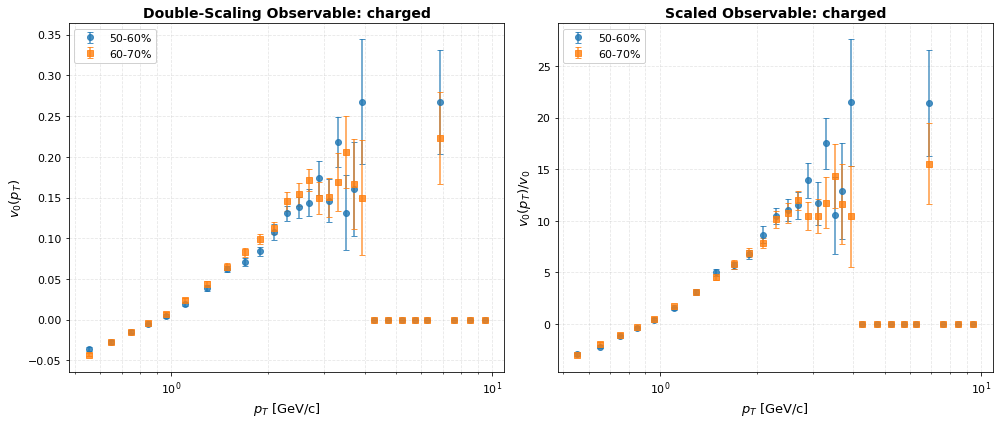


Done!


In [3]:
#!/usr/bin/env python3
"""
Load and plot v0(pT) results from pickle file.
Visualizes data for centralities 50-60% and 60-70%.
"""
import numpy as np
import pickle
import matplotlib.pyplot as plt
from pathlib import Path

# =============================================================================
# CONFIGURATION
# =============================================================================

# Input file (modify as needed)
INPUT_FILE = 'design_points_data/differential_radial_flow/v0pt_design_points_results_Pb_Pb_2760_Grad.pkl'

# Centralities to plot (indices in centbins array)
CENTRALITIES_TO_PLOT = {
    5: '50-60%',  # centbins[5] = [50, 60]
    6: '60-70%'   # centbins[6] = [60, 70]
}

# Species to plot
SPECIES = 'charged'  # Options: 'charged', 'pi', 'kaon', 'proton', 'Sigma', 'Xi'

# Design point to visualize (use 0 for first design point, or 'all' for average)
DESIGN_POINT_INDEX = 0

# =============================================================================
# LOAD DATA
# =============================================================================

def load_results(filename):
    """Load pickle file with v0(pT) results"""
    with open(filename, 'rb') as f:
        results = pickle.load(f)
    return results

def extract_data_for_centrality(results, cent_idx, species):
    """Extract v0(pT) data for specific centrality and species"""
    data = {
        'pt_centers': [],
        'v0pT': [],
        'v0pT_err': [],
        'v0_global': [],
        'v0_global_err': [],
        'x_scaled': [],
        'y_scaled': [],
        'y_scaled_err': []
    }
    
    for result in results:
        if cent_idx in result['centrality_data']:
            cent_data = result['centrality_data'][cent_idx]
            if species in cent_data:
                species_data = cent_data[species]
                
                # Store data
                for key in data.keys():
                    if key in species_data:
                        data[key].append(species_data[key])
    
    return data

# =============================================================================
# PLOTTING FUNCTIONS
# =============================================================================

def plot_v0pt_comparison(data_dict, species_name):
    """
    Create two subplots:
    1. v0(pT) vs pT (log scale)
    2. v0(pT)/v0 vs pT (log scale)
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
    markers = ['o', 's', '^', 'D', 'v']
    
    for idx, (cent_idx, cent_label) in enumerate(CENTRALITIES_TO_PLOT.items()):
        if cent_idx not in data_dict:
            print(f"Warning: Centrality {cent_label} not found in data")
            continue
        
        data = data_dict[cent_idx]
        color = colors[idx % len(colors)]
        marker = markers[idx % len(markers)]
        
        # Plot 1: v0(pT) vs pT
        ax1 = axes[0]
        ax1.errorbar(data['pt_centers'], data['v0pT'], yerr=data['v0pT_err'],
                    fmt=marker, color=color, label=cent_label, 
                    markersize=6, capsize=3, linewidth=1.5, alpha=0.8)
        
        # Plot 2: v0(pT)/v0 vs pT
        ax2 = axes[1]
        v0_ratio = data['v0pT'] / data['v0_global']
        v0_ratio_err = data['v0pT_err'] / data['v0_global']
        
        ax2.errorbar(data['pt_centers'], v0_ratio, yerr=v0_ratio_err,
                    fmt=marker, color=color, label=cent_label, 
                    markersize=6, capsize=3, linewidth=1.5, alpha=0.8)
    
    # Configure Plot 1
    ax1.set_xscale('log')
    ax1.set_xlabel(r'$p_T$ [GeV/c]', fontsize=13)
    ax1.set_ylabel(r'$v_0(p_T)$', fontsize=13)
    ax1.set_title(f'Double-Scaling Observable: {species_name}', fontsize=14, fontweight='bold')
    ax1.grid(True, alpha=0.3, which='both', linestyle='--')
    ax1.legend(fontsize=11, framealpha=0.9)
    ax1.tick_params(labelsize=11)
    
    # Configure Plot 2
    ax2.set_xscale('log')
    ax2.set_xlabel(r'$p_T$ [GeV/c]', fontsize=13)
    ax2.set_ylabel(r'$v_0(p_T) / v_0$', fontsize=13)
    ax2.set_title(f'Scaled Observable: {species_name}', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3, which='both', linestyle='--')
    ax2.legend(fontsize=11, framealpha=0.9)
    ax2.tick_params(labelsize=11)
    
    plt.tight_layout()
    return fig

# =============================================================================
# PRINT SUMMARY
# =============================================================================

def print_summary(results, cent_idx, species):
    """Print summary of saved data"""
    if len(results) == 0:
        print("No results to display")
        return
    
    # Get first design point for structure info
    first_result = results[DESIGN_POINT_INDEX]
    
    print("="*80)
    print("DATA SUMMARY")
    print("="*80)
    print(f"Input file: {INPUT_FILE}")
    print(f"Total design points: {len(results)}")
    print(f"Design point shown: {first_result['design_point']}")
    print(f"Delta-f model index: {first_result['delta_f']}")
    print(f"pT range (integrated): {first_result['pt_range_integrated']}")
    
    if cent_idx in first_result['centrality_data']:
        cent_data = first_result['centrality_data'][cent_idx]
        if species in cent_data:
            species_data = cent_data[species]
            
            print(f"\n--- Centrality: {CENTRALITIES_TO_PLOT[cent_idx]} ---")
            print(f"Number of events: {species_data['n_events']}")
            print(f"\nGlobal v0: {species_data['v0_global']:.6f} ± {species_data['v0_global_err']:.6f}")
            print(f"Ensemble mean pT: {species_data['mean_pt_ensemble']:.4f} GeV/c")
            
            print(f"\npT bins (differential):")
            pt_bins = first_result['pt_bins_differential']
            for i, (low, high) in enumerate(pt_bins):
                print(f"  Bin {i:2d}: [{low:5.2f}, {high:5.2f}] GeV/c")
            
            print(f"\nv0(pT) values:")
            print(f"{'pT center':>10s} {'v0(pT)':>12s} {'error':>12s} {'v0(pT)/v0':>12s}")
            print("-"*50)
            for i, pt in enumerate(species_data['pt_centers']):
                v0pt = species_data['v0pT'][i]
                err = species_data['v0pT_err'][i]
                ratio = v0pt / species_data['v0_global'] if species_data['v0_global'] != 0 else 0
                print(f"{pt:10.3f} {v0pt:12.6f} {err:12.6f} {ratio:12.4f}")
    
    print("="*80)

# =============================================================================
# MAIN EXECUTION
# =============================================================================

if __name__ == "__main__":
    # Check if file exists
    if not Path(INPUT_FILE).exists():
        print(f"Error: File '{INPUT_FILE}' not found!")
        print("\nPlease update INPUT_FILE variable with the correct filename.")
        exit(1)
    
    # Load results
    print(f"Loading data from {INPUT_FILE}...")
    all_results = load_results(INPUT_FILE)
    print(f"Loaded {len(all_results)} design points")
    
    if len(all_results) == 0:
        print("No data found in file!")
        exit(1)
    
    # Extract data for plotting (using single design point)
    data_by_centrality = {}
    result = all_results[DESIGN_POINT_INDEX]
    
    for cent_idx, cent_label in CENTRALITIES_TO_PLOT.items():
        if cent_idx in result['centrality_data']:
            cent_data = result['centrality_data'][cent_idx]
            if SPECIES in cent_data:
                species_data = cent_data[SPECIES]
                data_by_centrality[cent_idx] = species_data
    
    # Print summary for first centrality
    first_cent_idx = list(CENTRALITIES_TO_PLOT.keys())[0]
    print_summary(all_results, first_cent_idx, SPECIES)
    
    # Also print second centrality
    if len(CENTRALITIES_TO_PLOT) > 1:
        second_cent_idx = list(CENTRALITIES_TO_PLOT.keys())[1]
        print_summary(all_results, second_cent_idx, SPECIES)
    
    # Create plots
    print("\nGenerating plots...")
    fig = plot_v0pt_comparison(data_by_centrality, SPECIES)
    
    # Save figure
#    output_filename = f'v0pt_comparison_{SPECIES}_cent_50-70.png'
 #   plt.savefig(output_filename, dpi=300, bbox_inches='tight')
#    print(f"Plot saved to: {output_filename}")
    
    plt.show()
    
    print("\nDone!")

### Plotting all design points for one viscous correction

/tmp/ipykernel_2642/3099863509.py:80: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set_xlim(0, 4)


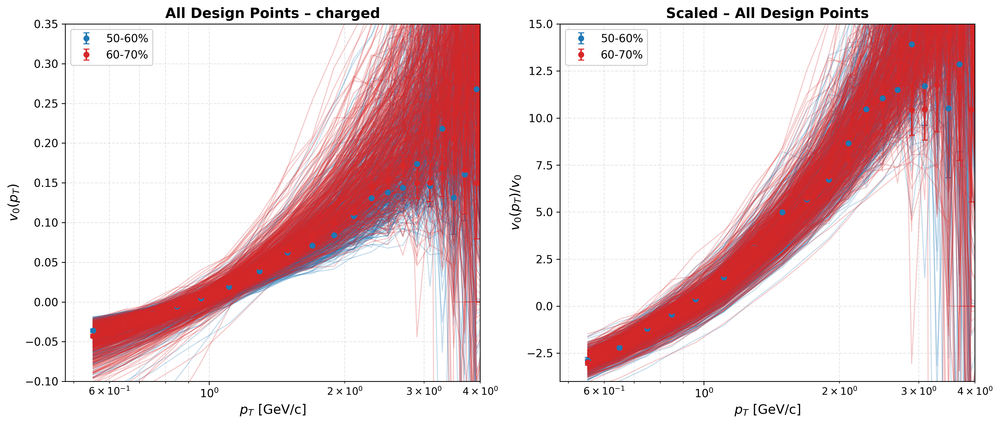

In [7]:
def plot_v0pt_all_design_points(results, species_name):
    """
    Create two subplots:
    1. v0(pT) vs pT (log scale)
    2. v0(pT)/v0 vs pT (log scale)
    
    For each centrality, overlay ALL design points in faint lines, and
    the selected DESIGN_POINT_INDEX with error bars.
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300)

    colors = {
        5: "#1f77b4",  # 50-60%
        6: "#d62728"   # 60-70%
    }

    # LOOP OVER CENTRALITIES
    for cent_idx, cent_label in CENTRALITIES_TO_PLOT.items():

        if cent_idx not in results[0]['centrality_data']:
            continue

        color = colors.get(cent_idx, 'gray')

        # ---------------------------------------------------------------------
        #  FIRST: PLOT ALL DESIGN POINTS AS FAINT LINES
        # ---------------------------------------------------------------------
        for dp, result in enumerate(results):
            if cent_idx not in result['centrality_data']:
                continue
            cent_data = result['centrality_data'][cent_idx]

            if SPECIES not in cent_data:
                continue

            sp = cent_data[SPECIES]

            pT = np.array(sp['pt_centers'])
            v0pt = np.array(sp['v0pT'])
            v0pt_err = np.array(sp['v0pT_err'])
            v0_global = sp['v0_global']

            ratio = v0pt / v0_global if v0_global != 0 else np.zeros_like(v0pt)

            # Plot faint lines (no error bars)
            axes[0].plot(pT, v0pt, color=color, alpha=0.25, linewidth=1)
            axes[1].plot(pT, ratio, color=color, alpha=0.25, linewidth=1)

        # ---------------------------------------------------------------------
        #  SECOND: PLOT MAIN DESIGN POINT WITH ERROR BARS
        # ---------------------------------------------------------------------
        main_dp = results[DESIGN_POINT_INDEX]
        cent_data = main_dp['centrality_data'][cent_idx][SPECIES]

        pT = np.array(cent_data['pt_centers'])
        v0pt = np.array(cent_data['v0pT'])
        v0pt_err = np.array(cent_data['v0pT_err'])
        v0_global = cent_data['v0_global']

        ratio = v0pt / v0_global if v0_global != 0 else np.zeros_like(v0pt)
        ratio_err = v0pt_err / v0_global if v0_global != 0 else np.zeros_like(v0pt_err)

        # MAIN LINE (with error bars)
        axes[0].errorbar(pT, v0pt, yerr=v0pt_err,
                         fmt='o', label=f"{cent_label}",
                         color=color, markersize=5, capsize=3, linewidth=1.5)

        axes[1].errorbar(pT, ratio, yerr=ratio_err,
                         fmt='o', label=f"{cent_label}",
                         color=color, markersize=5, capsize=3, linewidth=1.5)

    # -------------------------------------------------------------------------
    # AXIS SETTINGS
    # -------------------------------------------------------------------------
    for ax in axes:
        ax.set_xscale('log')
        ax.grid(True, alpha=0.3, which='both', linestyle='--')
        ax.tick_params(labelsize=11)
        ax.legend(fontsize=11, framealpha=0.9)
        ax.set_xlim(0, 4)

    axes[0].set_xlabel(r"$p_T$ [GeV/c]", fontsize=13)
    axes[0].set_ylabel(r"$v_0(p_T)$", fontsize=13)
    axes[0].set_title(f"All Design Points – {species_name}", fontsize=14, fontweight='bold')
    axes[0].set_ylim(-0.1, 0.35)

    axes[1].set_xlabel(r"$p_T$ [GeV/c]", fontsize=13)
    axes[1].set_ylabel(r"$v_0(p_T)/v_0$", fontsize=13)
    axes[1].set_title(f"Scaled – Pb-Pb 2.76 TeV Grad", fontsize=14, fontweight='bold')
    axes[1].set_ylim(-4, 15)

    plt.tight_layout()
    return fig

fig = plot_v0pt_all_design_points(all_results, SPECIES)

### Comparing different viscous corrections

* Plotting one centrality for different viscous corrections  

Loading data for all viscous corrections...
--------------------------------------------------------------------------------
Loading Grad...
  ✓ Loaded 500 design points
Loading CE...
  ✓ Loaded 500 design points
Loading PTM...
  ✓ Loaded 500 design points
Loading PTB...
  ✓ Loaded 500 design points
--------------------------------------------------------------------------------
VISCOUS CORRECTIONS COMPARISON SUMMARY
Centrality: 50-60%
Species: charged
Design point highlighted: 0

--------------------------------------------------------------------------------

Grad:
  Total design points: 500
  Design point ID: 0
  Delta-f model: 0
  Global v0: 0.012485 ± 0.000591
  Mean pT: 0.8787 GeV/c
  Events: 231

CE:
  Total design points: 500
  Design point ID: 0
  Delta-f model: 1
  Global v0: 0.012274 ± 0.000567
  Mean pT: 0.8828 GeV/c
  Events: 231

PTM:
  Total design points: 500
  Design point ID: 0
  Delta-f model: 2
  Global v0: 0.011598 ± 0.000516
  Mean pT: 0.8656 GeV/c
  Events: 231



/tmp/ipykernel_2642/3415789842.py:154: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set_xlim(0, 4)


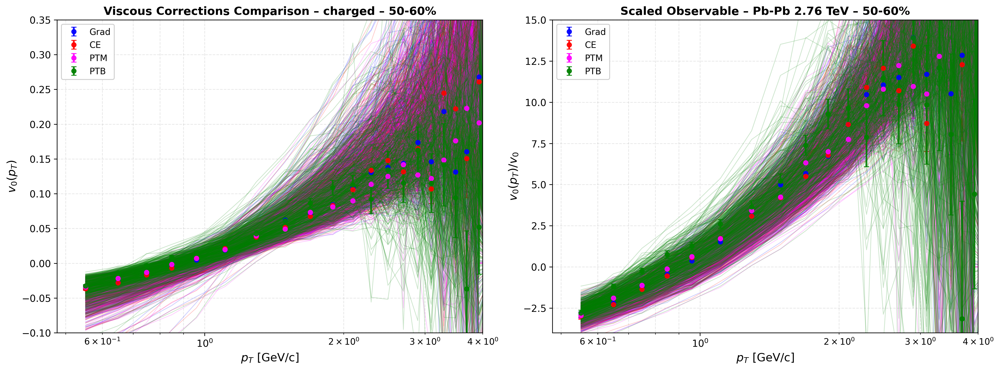


Done!


In [9]:
#!/usr/bin/env python3
"""
Compare v0(pT) results across different viscous corrections.
Plots all design points for each correction type in a single centrality.
"""
import numpy as np
import pickle
import matplotlib.pyplot as plt
from pathlib import Path

# =============================================================================
# CONFIGURATION
# =============================================================================

# Input files for different viscous corrections
VISCOUS_CORRECTIONS = {
    'Grad': 'design_points_data/differential_radial_flow/v0pt_design_points_results_Pb_Pb_2760_Grad.pkl',
    'CE': 'design_points_data/differential_radial_flow/v0pt_design_points_results_Pb_Pb_2760_CE.pkl',
    'PTM': 'design_points_data/differential_radial_flow/v0pt_design_points_results_Pb_Pb_2760_PTM.pkl',
    'PTB': 'design_points_data/differential_radial_flow/v0pt_design_points_results_Pb_Pb_2760_PTB.pkl'
}

# Centrality to plot (index in centbins array)
CENTRALITY_INDEX = 5  # 50-60%
CENTRALITY_LABEL = '50-60%'

# Species to plot
SPECIES = 'charged'  # Options: 'charged', 'pi', 'kaon', 'proton', 'Sigma', 'Xi'

# Design point to highlight with error bars (use 0 for first design point)
DESIGN_POINT_INDEX = 0

# =============================================================================
# LOAD DATA
# =============================================================================

def load_results(filename):
    """Load pickle file with v0(pT) results"""
    if not Path(filename).exists():
        print(f"Warning: File '{filename}' not found!")
        return None
    
    with open(filename, 'rb') as f:
        results = pickle.load(f)
    return results

def load_all_corrections():
    """Load data for all viscous corrections"""
    all_data = {}
    
    for correction_name, filepath in VISCOUS_CORRECTIONS.items():
        print(f"Loading {correction_name}...")
        results = load_results(filepath)
        if results is not None:
            all_data[correction_name] = results
            print(f"  ✓ Loaded {len(results)} design points")
        else:
            print(f"  ✗ Failed to load")
    
    return all_data

# =============================================================================
# PLOTTING FUNCTIONS
# =============================================================================

def plot_viscous_corrections_comparison(all_data, cent_idx, species_name):
    """
    Create two subplots comparing all viscous corrections:
    1. v0(pT) vs pT (log scale)
    2. v0(pT)/v0 vs pT (log scale)
    
    For each correction, overlay ALL design points as faint lines,
    and highlight the selected DESIGN_POINT_INDEX with error bars.
    """
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=300)
    
    # Color scheme for different corrections
    colors = {
        'Grad': 'blue',
        'CE': 'red',
        'PTM': 'magenta',
        'PTB': 'green'
    }
    
    # LOOP OVER VISCOUS CORRECTIONS
    for correction_name, results in all_data.items():
        if len(results) == 0:
            continue
        
        color = colors.get(correction_name, 'gray')
        
        # Check if centrality exists in data
        if cent_idx not in results[0]['centrality_data']:
            print(f"Warning: Centrality {CENTRALITY_LABEL} not found in {correction_name}")
            continue
        
        # ---------------------------------------------------------------------
        # FIRST: PLOT ALL DESIGN POINTS AS FAINT LINES
        # ---------------------------------------------------------------------
        for dp_idx, result in enumerate(results):
            if cent_idx not in result['centrality_data']:
                continue
            cent_data = result['centrality_data'][cent_idx]
            if species_name not in cent_data:
                continue
            
            sp = cent_data[species_name]
            pT = np.array(sp['pt_centers'])
            v0pt = np.array(sp['v0pT'])
            v0_global = sp['v0_global']
            ratio = v0pt / v0_global if v0_global != 0 else np.zeros_like(v0pt)
            
            # Plot faint lines (no error bars, no label)
            axes[0].plot(pT, v0pt, color=color, alpha=0.2, linewidth=0.8)
            axes[1].plot(pT, ratio, color=color, alpha=0.2, linewidth=0.8)
        
        # ---------------------------------------------------------------------
        # SECOND: PLOT MAIN DESIGN POINT WITH ERROR BARS
        # ---------------------------------------------------------------------
        if DESIGN_POINT_INDEX < len(results):
            main_dp = results[DESIGN_POINT_INDEX]
            if cent_idx in main_dp['centrality_data']:
                cent_data = main_dp['centrality_data'][cent_idx]
                if species_name in cent_data:
                    sp = cent_data[species_name]
                    pT = np.array(sp['pt_centers'])
                    v0pt = np.array(sp['v0pT'])
                    v0pt_err = np.array(sp['v0pT_err'])
                    v0_global = sp['v0_global']
                    v0_global_err = sp['v0_global_err']
                    
                    ratio = v0pt / v0_global if v0_global != 0 else np.zeros_like(v0pt)
                    ratio_err = v0pt_err / v0_global if v0_global != 0 else np.zeros_like(v0pt_err)
                    
                    # MAIN LINE (with error bars and label)
                    axes[0].errorbar(pT, v0pt, yerr=v0pt_err,
                                   fmt='o', label=correction_name,
                                   color=color, markersize=5, capsize=3, 
                                   linewidth=2, alpha=0.9)
                    
                    axes[1].errorbar(pT, ratio, yerr=ratio_err,
                                   fmt='o', label=correction_name,
                                   color=color, markersize=5, capsize=3, 
                                   linewidth=2, alpha=0.9)
    
    # -------------------------------------------------------------------------
    # AXIS SETTINGS
    # -------------------------------------------------------------------------
    for ax in axes:
        ax.set_xscale('log')
        ax.grid(True, alpha=0.3, which='both', linestyle='--')
        ax.tick_params(labelsize=11)
        ax.legend(fontsize=10, framealpha=0.95, loc='best')
        ax.set_xlim(0, 4)
    
    # Left panel: v0(pT)
    axes[0].set_xlabel(r"$p_T$ [GeV/c]", fontsize=13)
    axes[0].set_ylabel(r"$v_0(p_T)$", fontsize=13)
    axes[0].set_title(f"Viscous Corrections Comparison – {species_name} – {CENTRALITY_LABEL}", 
                     fontsize=13, fontweight='bold')
    axes[0].set_ylim(-0.1, 0.35)
    
    # Right panel: v0(pT)/v0
    axes[1].set_xlabel(r"$p_T$ [GeV/c]", fontsize=13)
    axes[1].set_ylabel(r"$v_0(p_T)/v_0$", fontsize=13)
    axes[1].set_title(f"Scaled Observable – Pb-Pb 2.76 TeV – {CENTRALITY_LABEL}", 
                     fontsize=13, fontweight='bold')
    axes[1].set_ylim(-4, 15)
    
    plt.tight_layout()
    return fig

def print_comparison_summary(all_data, cent_idx, species_name):
    """Print summary comparing all viscous corrections"""
    print("="*80)
    print("VISCOUS CORRECTIONS COMPARISON SUMMARY")
    print("="*80)
    print(f"Centrality: {CENTRALITY_LABEL}")
    print(f"Species: {species_name}")
    print(f"Design point highlighted: {DESIGN_POINT_INDEX}")
    print("\n" + "-"*80)
    
    for correction_name, results in all_data.items():
        print(f"\n{correction_name}:")
        print(f"  Total design points: {len(results)}")
        
        if len(results) > 0 and DESIGN_POINT_INDEX < len(results):
            result = results[DESIGN_POINT_INDEX]
            print(f"  Design point ID: {result['design_point']}")
            print(f"  Delta-f model: {result['delta_f']}")
            
            if cent_idx in result['centrality_data']:
                cent_data = result['centrality_data'][cent_idx]
                if species_name in cent_data:
                    sp = cent_data[species_name]
                    print(f"  Global v0: {sp['v0_global']:.6f} ± {sp['v0_global_err']:.6f}")
                    print(f"  Mean pT: {sp['mean_pt_ensemble']:.4f} GeV/c")
                    print(f"  Events: {sp['n_events']}")
    
    print("\n" + "="*80)

# =============================================================================
# MAIN EXECUTION
# =============================================================================

if __name__ == "__main__":
    # Load all viscous correction data
    print("Loading data for all viscous corrections...")
    print("-"*80)
    all_data = load_all_corrections()
    print("-"*80)
    
    if len(all_data) == 0:
        print("\nError: No data files could be loaded!")
        print("Please check the file paths in VISCOUS_CORRECTIONS dictionary.")
        exit(1)
    
    # Print comparison summary
    print_comparison_summary(all_data, CENTRALITY_INDEX, SPECIES)
    
    # Create comparison plot
    print("\nGenerating comparison plots...")
    fig = plot_viscous_corrections_comparison(all_data, CENTRALITY_INDEX, SPECIES)
    
    # Save figure
#    output_filename = f'v0pt_viscous_comparison_{SPECIES}_cent_{CENTRALITY_LABEL.replace("-", "")}.png'
#    plt.savefig(output_filename, dpi=300, bbox_inches='tight')
#    print(f"Plot saved to: {output_filename}")
    
    plt.show()
    
    print("\nDone!")

### Overlaying experimental data

### PCA

### Building emulators

### GSA

### 